In [1]:
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from astropy.io import fits
from pandas import read_csv

# from lmfit import Model, fit_report
# from lmfit.models import LinearModel
# from scipy.signal import argrelextrema

import os
plots_dir = os.path.abspath('./../plots/vel')+'/'


h2_vprf = fits.open('h2_vprf.fits', ignore_missing_end=True)[0].data
h3p_vprf = fits.open('h3p_vprf.fits', ignore_missing_end=True)[0].data
h2_verr = fits.open('h2_vprf_err.fits', ignore_missing_end=True)[0].data
h3p_verr = fits.open('h3p_vprf_err.fits', ignore_missing_end=True)[0].data

h2_int = fits.open('h2_int_shifted.fits', ignore_missing_end=True)[0].data
h3p_int = fits.open('h3p_int_shifted.fits', ignore_missing_end=True)[0].data
h2_int_err = fits.open('h2_int_shifted_error.fits', ignore_missing_end=True)[0].data
h3p_int_err = fits.open('h3p_int_shifted_error.fits', ignore_missing_end=True)[0].data
# ref_sun = fits.open('ref_sun.fits', ignore_missing_end=True)[0].data

# lat = fits.open('latit.fits', ignore_missing_end=True)[0].data
# long = fits.open('longit.fits', ignore_missing_end=True)[0].data

cmlsel = read_csv('cml-sel.txt', sep='\s+', header=None)
cml = cmlsel[3].to_numpy()
sel = cmlsel[4].to_numpy()

vmp = 3.41*np.sin((185-cml)*(np.pi/180))*np.cos((sel)*(np.pi/180))

h2_vprf[h2_verr > 4] = np.nan
h3p_vprf[h3p_verr > 4] = np.nan

h2_vprf[h2_vprf > 6] = np.nan
h3p_vprf[h3p_vprf > 6] = np.nan
h2_vprf[h2_vprf < -6] = np.nan
h3p_vprf[h3p_vprf < -6] = np.nan

h2_vprf[:,:20] = np.nan
h3p_vprf[:,:20] = np.nan
h2_vprf[:,280:] = np.nan
h3p_vprf[:,280:] = np.nan

h2_verr[np.isnan(h2_vprf)] = np.nan
h3p_verr[np.isnan(h3p_vprf)] = np.nan


h2_vorf = fits.open('h2_vorf.fits', ignore_missing_end=True)[0].data
h3p_vorf = fits.open('h3p_vorf.fits', ignore_missing_end=True)[0].data
h2_vorf_err = fits.open('h2_vorf_err.fits', ignore_missing_end=True)[0].data
h3p_vorf_err = fits.open('h3p_vorf_err.fits', ignore_missing_end=True)[0].data

h2_vorf[h2_vorf_err > 4] = np.nan
h3p_vorf[h3p_vorf_err > 4] = np.nan

h2_vorf[h2_vorf > 8] = np.nan
h3p_vorf[h3p_vorf > 8] = np.nan
h2_vorf[h2_vorf < -8] = np.nan
h3p_vorf[h3p_vorf < -8] = np.nan

h2_vorf[:,:20] = np.nan
h3p_vorf[:,:20] = np.nan
h2_vorf[:,280:] = np.nan
h3p_vorf[:,280:] = np.nan

h2_vorf_err[np.isnan(h2_vorf)] = np.nan
h3p_vorf_err[np.isnan(h3p_vorf)] = np.nan
# h2_int[np.isnan(h2_vprf)] = np.nan
# h3p_int[np.isnan(h3p_vprf)] = np.nan
h2_int[np.isnan(h2_vorf)] = np.nan
h3p_int[np.isnan(h3p_vorf)] = np.nan


ang_diam = 40.58867
ang_diam/(0.1)
limb_vel = 12.572
vel_slope = limb_vel * 2 / (ang_diam/(0.1))

x = np.linspace(-150,150,301)
rot_rate = vel_slope * x
xnew = np.linspace(-150,150,301)

a2 = h2_vprf*(-1)
b2 = h3p_vprf*(-1)

h2vo = h2_vorf*(-1)
h3vo = h3p_vorf*(-1)

c2 = b2 - a2
errc2 = np.sqrt((h3p_verr)**2 + (h2_verr)**2)

c3 = c2 + 0
c_min = c2 - errc2
c_max = c2 + errc2
c_max_t = c3/c_max
c_min_t = c3/c_min
c_max_t[c_max_t <0] = 0
c_min_t[c_min_t <0] = 0
m3 = c_max_t * c_min_t

m3[m3 > 0] = 1

d3 = c3 * m3
d3a = c_min * m3
d3b = c_max * m3

e3 = c3 *0
e3[d3 > 0] = c_min[d3 > 0]
e3[d3 < 0] = c_max[d3 < 0]

vcur = c2
vcurmax = vcur + errc2
vcurmin = vcur - errc2

In [2]:
hdu_h2vp = fits.PrimaryHDU(a2)
hdu_h2vp.writeto('neutral_drift_prf.fits', overwrite=True)

hdu_h3vp = fits.PrimaryHDU(b2)
hdu_h3vp.writeto('ion_drift_prf.fits', overwrite=True)

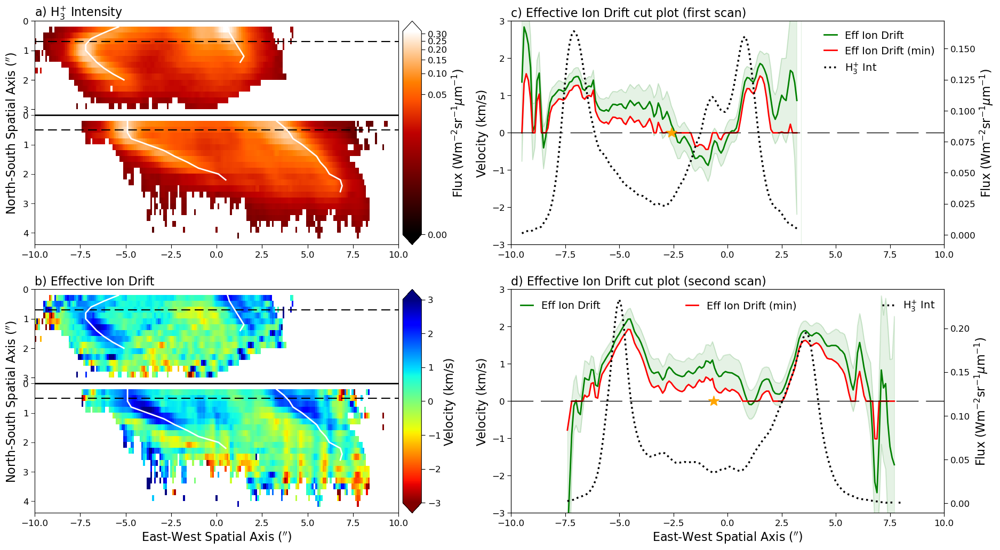

In [4]:
h3p_int_rs = scipy.ndimage.zoom(h3p_int, [2,1], order=0)
eff_ion_drift_rs = scipy.ndimage.zoom(c3, [2,1], order=0)
eff_ion_drift_min_rs = scipy.ndimage.zoom(e3, [2,1], order=0)

xnew = np.linspace(-15,15,301)

peak11 = np.array([np.nan,96,88,81,78,78,81,84,88,93,99])
peak12 = np.array([np.nan,156,157,159,161,163,165,163])

peak21 = np.array([np.nan,101,101,101,103,112,121,127,134,140,151,155])
peak22 = np.array([np.nan,183,187,190,192,197,201,205,207,210,212,218,219,218])

fig = plt.figure(figsize=(22, 12))

ax1 = fig.add_subplot(2,2,1)
# ax1 = fig.add_subplot(2,3,1)
im1 = ax1.imshow(h3p_int_rs, 
           aspect='auto', 
           interpolation='none', 
           cmap='gist_heat',
#            extent=[-150, 150, 146.0669, 189.0669], 
           extent=[-15,15,7.6,0],
           norm=PowerNorm(gamma=0.2))
ax1.set_xlim(-10,10)
ax1.set_ylabel('North-South Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax1.set_yticks([0, 1, 2, 3])
ax1.set_yticklabels(['0', '1', '2', '3'])
ax1.tick_params(axis='y', length=5, which='major', labelsize='large')
ax1.set_yticks([3.2, 4.2, 5.2, 6.2, 7.2], minor=True)
ax1.set_yticklabels(['0','1','2','3','4'], minor=True)
ax1.tick_params(axis='y', length=5, which='minor', labelsize='large')
# ax1.set_xlabel('East-West Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax1.tick_params(axis='x', length=5, labelsize='large')
ax1.set_title('a) H$_3^{+}$ Intensity', loc='left', fontsize=16)
plt.axhline(y=3.2, color='black', ls='solid', lw=2)
plt.plot(np.linspace(-10,10,201),np.ones(201)*0.7, color='black', ls='dashed', dashes=(8, 4), lw=1.5)
plt.plot(np.linspace(-10,10,201),np.ones(201)*3.7, color='black', ls='dashed', dashes=(8, 4), lw=1.5)
plt.plot((peak11-150)/10, np.array(range(0,len(peak11)*2,2))/10, ls='-', lw=2, color='white')
plt.plot((peak12-150)/10, np.array(range(0,len(peak12)*2,2))/10, ls='-', lw=2, color='white')
plt.plot((peak21-150)/10, np.array(range(0,len(peak21)*2,2))/10+3.2, ls='-', lw=2, color='white')
plt.plot((peak22-150)/10, np.array(range(0,len(peak22)*2,2))/10+3.2, ls='-', lw=2, color='white')
# plt.plot((peak11-150)/10, np.linspace(0,len(peak11)/10,len(peak11)), ls='-', lw=1.5, color='white')
# plt.plot((peak12-150)/10, np.linspace(0,len(peak12)/10,len(peak12)), ls='-', lw=1.5, color='white')
# plt.plot((peak21-150)/10, np.linspace(1.6,1.6+len(peak21)/10,len(peak21)), ls='-', lw=1.5, color='white')
# plt.plot((peak22-150)/10, np.linspace(1.6,1.6+len(peak22)/10,len(peak22)), ls='-', lw=1.5, color='white')
cbar1 = plt.colorbar(im1, extend='both', aspect=12, pad=0.01, shrink=1)
cbar1.ax.tick_params(length=5, labelsize='large')
cbar1.set_label(label='Flux (Wm$^{-2}$sr$^{-1}$$\mu$m$^{-1}$)', size=16)


ax2 = fig.add_subplot(2,2,3)
# ax2 = fig.add_subplot(2,3,2)
im2 = ax2.imshow(eff_ion_drift_rs, 
           aspect='auto', 
           interpolation='none', 
           cmap='jet_r', 
           extent=[-15,15,7.6,0],
           vmin=-3, 
           vmax=3)
ax2.set_xlim(-10,10)
ax2.set_ylabel('North-South Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax2.set_yticks([0, 1, 2, 3])
ax2.set_yticklabels(['0', '1', '2', '3'])
ax2.tick_params(axis='y', length=5, which='major', labelsize='large')
ax2.set_yticks([3.2, 4.2, 5.2, 6.2, 7.2], minor=True)
ax2.set_yticklabels(['0','1','2','3','4'], minor=True)
ax2.tick_params(axis='y', length=5, which='minor', labelsize='large')
ax2.set_xlabel('East-West Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax2.tick_params(axis='x', length=5, labelsize='large')
ax2.set_title('b) Effective Ion Drift', loc='left', fontsize=16)
plt.axhline(y=3.2, color='black', ls='solid', lw=2)
plt.plot(np.linspace(-10,10,201),np.ones(201)*0.7, color='black', ls='dashed', dashes=(8, 4), lw=1.5)
plt.plot(np.linspace(-10,10,201),np.ones(201)*3.7, color='black', ls='dashed', dashes=(8, 4), lw=1.5)
plt.plot((peak11-150)/10, np.array(range(0,len(peak11)*2,2))/10, ls='-', lw=2, color='white')
plt.plot((peak12-150)/10, np.array(range(0,len(peak12)*2,2))/10, ls='-', lw=2, color='white')
plt.plot((peak21-150)/10, np.array(range(0,len(peak21)*2,2))/10+3.2, ls='-', lw=2, color='white')
plt.plot((peak22-150)/10, np.array(range(0,len(peak22)*2,2))/10+3.2, ls='-', lw=2, color='white')
cbar2 = plt.colorbar(im2, extend='both', aspect=12, pad=0.01, shrink=1)
cbar2.ax.tick_params(length=5, labelsize='large')
cbar2.set_label(label='Velocity (km/s)', size=16)


vcur = c2[3]
vcurmax = vcur + errc2[3]
vcurmin = vcur - errc2[3]
vmin = e3[3]
h3pint = h3p_int[3]

pole_rate = -rot_rate*0
polar_rate = pole_rate - pole_rate[119] + vmp[3]

ax3 = fig.add_subplot(2,2,2)
# ax3 = fig.add_subplot(2,3,4)
ax3.plot(xnew, vcur, color='green', label='Eff Ion Drift', lw=2)
ax3.plot(xnew, vcurmax, color='green', alpha=0.1)
ax3.plot(xnew, vcurmin, color='green', alpha=0.1)
ax3.fill_between(xnew, vcurmin, vcurmax, color='green', alpha=0.1)
ax3.plot(xnew, vmin, color='red', ls='-', label='Eff Ion Drift (min)', lw=2)
ax3.axhline(y=0, color='black', ls='dashed', dashes=(30, 10), lw=1)
# ax3.plot(xnew, polar_rate, color='black', ls='dashdot', lw=1.5)
# ax3.plot(xnew, vmp[3]+rot_rate, color='black', ls='dashdot', lw=1.5)
ax3.plot(-2.6, 0, ms=15, c='orange', marker='*')
ax3.set_xlim(-10,10)
ax3.set_ylim(-3,3)
ax3.set_ylabel('Velocity (km/s)', fontsize=16)
# ax3.set_xlabel('East-West Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax3.tick_params(axis='both', length=5, labelsize='large')
ax3.set_title('c) Effective Ion Drift cut plot (first scan)', loc='left', fontsize=16)

ax3a = ax3.twinx()
ax3a.plot(xnew, h3pint, color='k', ls=':', label='H$_3^{+}$ Int', lw=2.5)
ax3a.set_ylabel('Flux (Wm$^{-2}$sr$^{-1}$$\mu$m$^{-1}$)', fontsize=16)
ax3a.tick_params(axis='y', length=5, labelsize='large')

lines, labels = ax3.get_legend_handles_labels()
lines2, labels2 = ax3a.get_legend_handles_labels()
ax3.legend(lines + lines2, labels + labels2, loc='upper right', handlelength=1.2, frameon=False, fontsize=14)




# ax3 = fig.add_subplot(2,3,4)
# im3 = ax3.imshow(eff_ion_drift_min_rs, 
#            aspect='auto', 
#            interpolation='none', 
#            cmap='jet_r', 
#            extent=[-15,15,7.6,0],
#            vmin=-4, 
#            vmax=4)
# ax3.set_xlim(-10,10)
# ax3.set_ylabel('North-South Spatial Axis ($^{\prime\prime}$)', fontsize=16)
# ax3.set_yticks([0, 1, 2, 3])
# ax3.set_yticklabels(['0', '1', '2', '3'])
# ax3.tick_params(axis='y', length=5, which='major', labelsize='large')
# ax3.set_yticks([3.2, 4.2, 5.2, 6.2, 7.2], minor=True)
# ax3.set_yticklabels(['0','1','2','3','4'], minor=True)
# ax3.tick_params(axis='y', length=5, which='minor', labelsize='large')
# ax3.set_xlabel('East-West Spatial Axis ($^{\prime\prime}$)', fontsize=16)
# ax3.tick_params(axis='x', length=5, labelsize='large')
# ax3.set_title('c)', loc='left', fontsize=16)
# plt.plot(np.linspace(-10,10,201),np.ones(201)*3.7, color='black', ls='dashed', dashes=(8, 5), lw=2)
# plt.plot((peak11-150)/10, np.array(range(0,len(peak11)*2,2))/10, ls='-', lw=2, color='white')
# plt.plot((peak12-150)/10, np.array(range(0,len(peak12)*2,2))/10, ls='-', lw=2, color='white')
# plt.plot((peak21-150)/10, np.array(range(0,len(peak21)*2,2))/10+3.2, ls='-', lw=2, color='white')
# plt.plot((peak22-150)/10, np.array(range(0,len(peak22)*2,2))/10+3.2, ls='-', lw=2, color='white')
# cbar3 = plt.colorbar(im3, extend='both', aspect=12, pad=0.01, shrink=1)
# cbar3.ax.tick_params(length=5, labelsize='large')
# cbar3.set_label(label='Effective Ion Drift (km/s)', size=16)


vcur = c2[18]
vcurmax = vcur + errc2[18]
vcurmin = vcur - errc2[18]
vmin = e3[18]
h3pint = h3p_int[18]

pole_rate = -rot_rate*0
polar_rate = pole_rate - pole_rate[143] + vmp[18]

ax4 = fig.add_subplot(2,2,4)
# ax4 = fig.add_subplot(2,3,5)
ax4.plot(xnew, vcur, color='green', label='Eff Ion Drift', lw=2)
ax4.plot(xnew, vcurmax, color='green', alpha=0.1)
ax4.plot(xnew, vcurmin, color='green', alpha=0.1)
ax4.fill_between(xnew, vcurmin, vcurmax, color='green', alpha=0.1)
ax4.plot(xnew, vmin, color='red', ls='-', label='Eff Ion Drift (min)', lw=2)
ax4.axhline(y=0, color='black', ls='dashed', dashes=(30, 10), lw=1)
# ax4.plot(xnew, polar_rate, color='black', ls='dashdot', lw=1.5)
# ax4.plot(xnew, vmp[18]+rot_rate, color='black', ls='dashdot', lw=1.5)
ax4.plot(-0.65, 0, ms=15, c='orange', marker='*')
ax4.set_xlim(-10,10)
ax4.set_ylim(-3,3)
ax4.set_ylabel('Velocity (km/s)', fontsize=16)
ax4.set_xlabel('East-West Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax4.tick_params(axis='both', length=5, labelsize='large')
ax4.set_title('d) Effective Ion Drift cut plot (second scan)', loc='left', fontsize=16)

ax4a = ax4.twinx()
ax4a.plot(xnew, h3pint, color='k', ls=':', label='H$_3^{+}$ Int', lw=2.5)
ax4a.set_ylabel('Flux (Wm$^{-2}$sr$^{-1}$$\mu$m$^{-1}$)', fontsize=16)
ax4a.tick_params(axis='y', length=5, labelsize='large')

lines, labels = ax4.get_legend_handles_labels()
lines2, labels2 = ax4a.get_legend_handles_labels()
ax4.legend(lines + lines2, labels + labels2, loc='upper center', ncols=3, mode='expand', handlelength=1.2, frameon=False, fontsize=14)

plt.subplots_adjust(wspace=0.1)

# plt.savefig(plots_dir+'eff_ion_drift.pdf', dpi=600, bbox_inches='tight', facecolor='white')

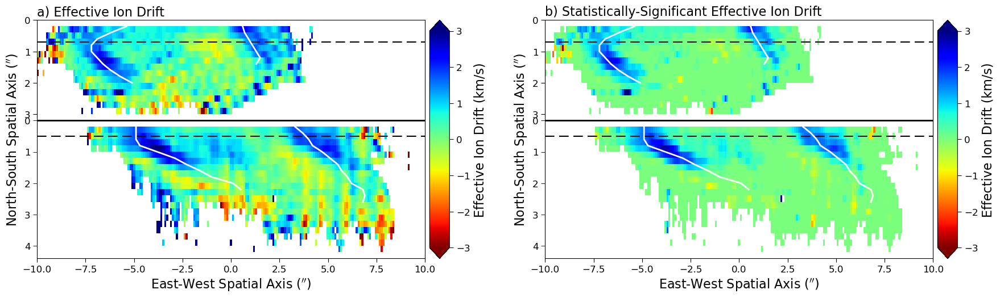

In [7]:
fig = plt.figure(figsize=(22, 12))

ax1 = fig.add_subplot(2,2,1)
im1 = ax1.imshow(eff_ion_drift_rs, 
           aspect='auto', 
           interpolation='none', 
           cmap='jet_r', 
           extent=[-15,15,7.6,0],
           vmin=-3, 
           vmax=3)
ax1.set_xlim(-10,10)
ax1.set_ylabel('North-South Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax1.set_yticks([0, 1, 2, 3])
ax1.set_yticklabels(['0', '1', '2', '3'])
ax1.tick_params(axis='y', length=5, which='major', labelsize='large')
ax1.set_yticks([3.2, 4.2, 5.2, 6.2, 7.2], minor=True)
ax1.set_yticklabels(['0','1','2','3','4'], minor=True)
ax1.tick_params(axis='y', length=5, which='minor', labelsize='large')
ax1.set_xlabel('East-West Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax1.tick_params(axis='x', length=5, labelsize='large')
ax1.set_title('a) Effective Ion Drift', loc='left', fontsize=16)
plt.axhline(y=3.2, color='black', ls='solid', lw=2)
plt.plot(np.linspace(-10,10,201),np.ones(201)*0.7, color='black', ls='dashed', dashes=(8, 4), lw=1.5)
plt.plot(np.linspace(-10,10,201),np.ones(201)*3.7, color='black', ls='dashed', dashes=(8, 4), lw=1.5)
plt.plot((peak11-150)/10, np.array(range(0,len(peak11)*2,2))/10, ls='-', lw=2, color='white')
plt.plot((peak12-150)/10, np.array(range(0,len(peak12)*2,2))/10, ls='-', lw=2, color='white')
plt.plot((peak21-150)/10, np.array(range(0,len(peak21)*2,2))/10+3.2, ls='-', lw=2, color='white')
plt.plot((peak22-150)/10, np.array(range(0,len(peak22)*2,2))/10+3.2, ls='-', lw=2, color='white')
cbar2 = plt.colorbar(im1, extend='both', aspect=12, pad=0.01, shrink=1)
cbar2.ax.tick_params(length=5, labelsize='large')
cbar2.set_label(label='Effective Ion Drift (km/s)', size=16)

ax2 = fig.add_subplot(2,2,2)
im2 = ax2.imshow(eff_ion_drift_min_rs, 
           aspect='auto', 
           interpolation='none', 
           cmap='jet_r', 
           extent=[-15,15,7.6,0],
           vmin=-3, 
           vmax=3)
ax2.set_xlim(-10,10)
ax2.set_ylabel('North-South Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax2.set_yticks([0, 1, 2, 3])
ax2.set_yticklabels(['0', '1', '2', '3'])
ax2.tick_params(axis='y', length=5, which='major', labelsize='large')
ax2.set_yticks([3.2, 4.2, 5.2, 6.2, 7.2], minor=True)
ax2.set_yticklabels(['0','1','2','3','4'], minor=True)
ax2.tick_params(axis='y', length=5, which='minor', labelsize='large')
ax2.set_xlabel('East-West Spatial Axis ($^{\prime\prime}$)', fontsize=16)
ax2.tick_params(axis='x', length=5, labelsize='large')
ax2.set_title('b) Statistically-Significant Effective Ion Drift', loc='left', fontsize=16)
plt.axhline(y=3.2, color='black', ls='solid', lw=2)
plt.plot(np.linspace(-10,10,201),np.ones(201)*0.7, color='black', ls='dashed', dashes=(8, 4), lw=1.5)
plt.plot(np.linspace(-10,10,201),np.ones(201)*3.7, color='black', ls='dashed', dashes=(8, 4), lw=1.5)
plt.plot((peak11-150)/10, np.array(range(0,len(peak11)*2,2))/10, ls='-', lw=2, color='white')
plt.plot((peak12-150)/10, np.array(range(0,len(peak12)*2,2))/10, ls='-', lw=2, color='white')
plt.plot((peak21-150)/10, np.array(range(0,len(peak21)*2,2))/10+3.2, ls='-', lw=2, color='white')
plt.plot((peak22-150)/10, np.array(range(0,len(peak22)*2,2))/10+3.2, ls='-', lw=2, color='white')
cbar2 = plt.colorbar(im2, extend='both', aspect=12, pad=0.01, shrink=1)
cbar2.ax.tick_params(length=5, labelsize='large')
cbar2.set_label(label='Effective Ion Drift (km/s)', size=16)

plt.subplots_adjust(wspace=0.1)

# plt.savefig(plots_dir+'ss_eff_ion_drift.pdf', dpi=600, bbox_inches='tight', facecolor='white')

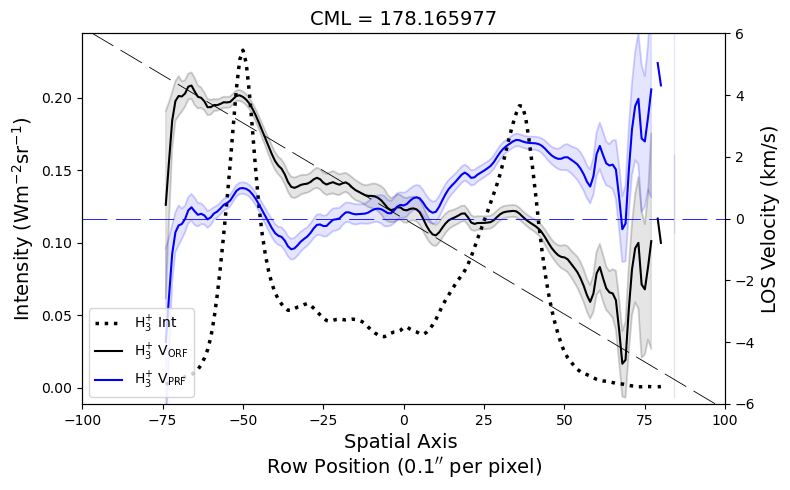

In [3]:
# for i in range(len(h3p_vprf)):
for i in range(18, 19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
#         int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (8, 5))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vh2 = a2[i]
        vh2max = a2[i] + h2_verr[i]
        vh2min = a2[i] - h2_verr[i]
        
        vh3p = b2[i]
        vh3pmax = b2[i] + h3p_verr[i]
        vh3pmin = b2[i] - h3p_verr[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$ Int', lw=2.5)
#         ax.plot(xnew, int2[i], color='orange', ls='-.', label='Ref Sun', lw=1)
        
#         ax2.plot(xnew, vh2, color='red', label='H$_2$')        
#         ax2.plot(xnew, vh2max, color='mistyrose')
#         ax2.plot(xnew, vh2min, color='mistyrose')
#         ax2.fill_between(xnew, vh2min, vh2max, color='mistyrose')

        ax2.plot(xnew, h3vo[i], color='black', label='H$_3^{+}$ V$_{\mathrm{ORF}}$')
        ax2.plot(xnew, h3vo[i]+h3p_vorf_err[i], color='black', alpha=0.1)
        ax2.plot(xnew, h3vo[i]-h3p_vorf_err[i], color='black', alpha=0.1)
        ax2.fill_between(xnew, h3vo[i]-h3p_vorf_err[i], h3vo[i]+h3p_vorf_err[i], color='black', alpha=0.1)
        
        ax2.plot(xnew, vh3p, color='blue', label='H$_3^{+}$ V$_{\mathrm{PRF}}$')
        ax2.plot(xnew, vh3pmax, color='blue', alpha=0.1)
        ax2.plot(xnew, vh3pmin, color='blue', alpha=0.1)
        ax2.fill_between(xnew, vh3pmin, vh3pmax, color='blue', alpha=0.1)
        
        ax2.plot(xnew, -rot_rate, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='r', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='b', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c2[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')

#         ax2.text(-98, 0.2, 'DAWN', fontsize = 15)
#         ax2.text(85, 0.2, 'DUSK', fontsize = 15)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
#         ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        ax2.set_ylabel('LOS Velocity (km/s)', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
#         plt.axhline(y=vmp[i], color='black', ls='dashed', dashes=(30, 10), lw=0.6)
#         plt.text(-145,vmp[i]-0.7, 'V$_{\mathrm{mp}}$ = '+str(round(vmp[i], 4)), fontsize=14)
        plt.axhline(y=0, color='blue', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-100,100)
        plt.ylim(-6,6)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=3)
        
        plt.tight_layout()
#         plt.savefig(plots_dir+'h3p_vprf_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


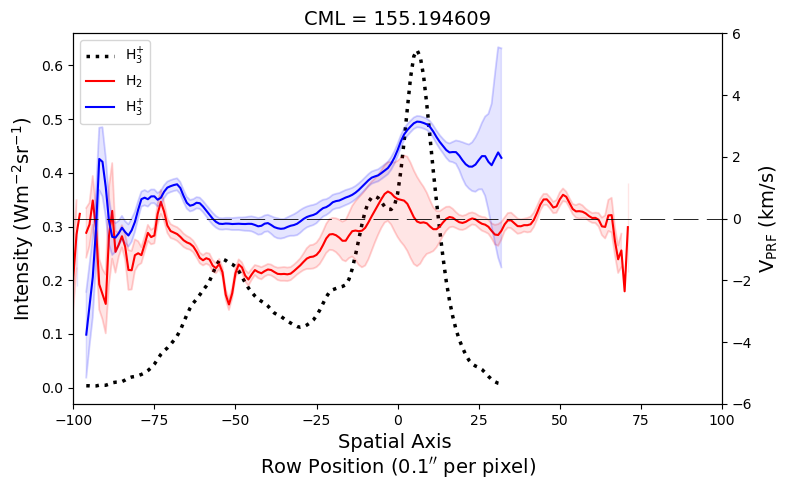

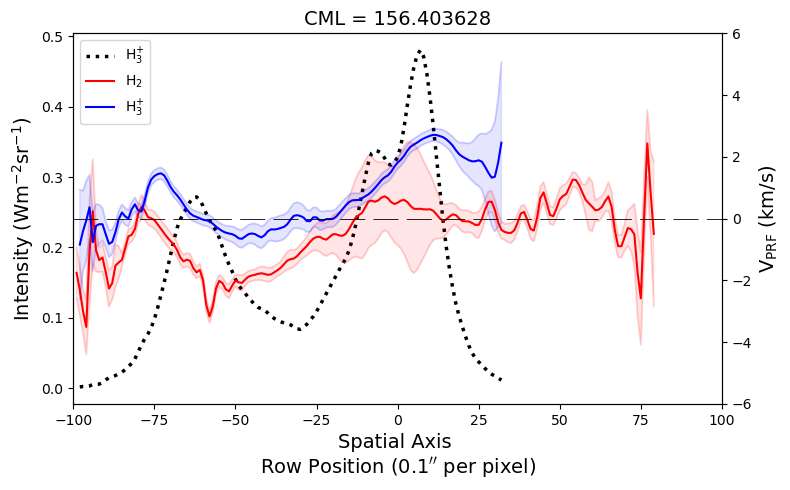

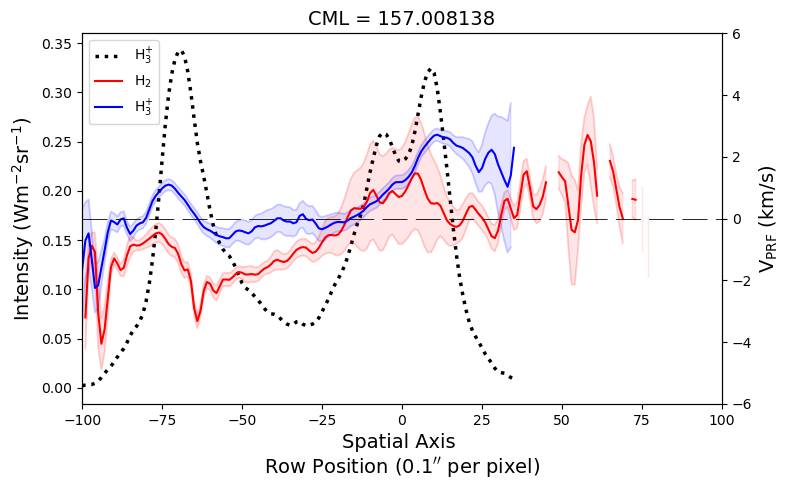

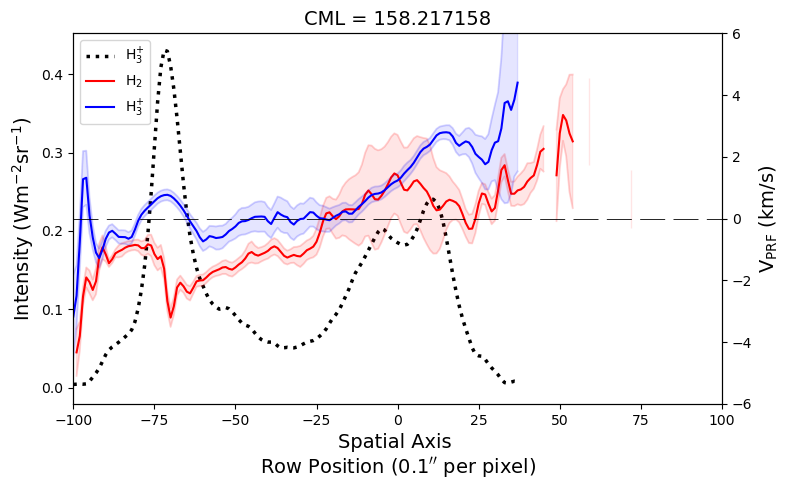

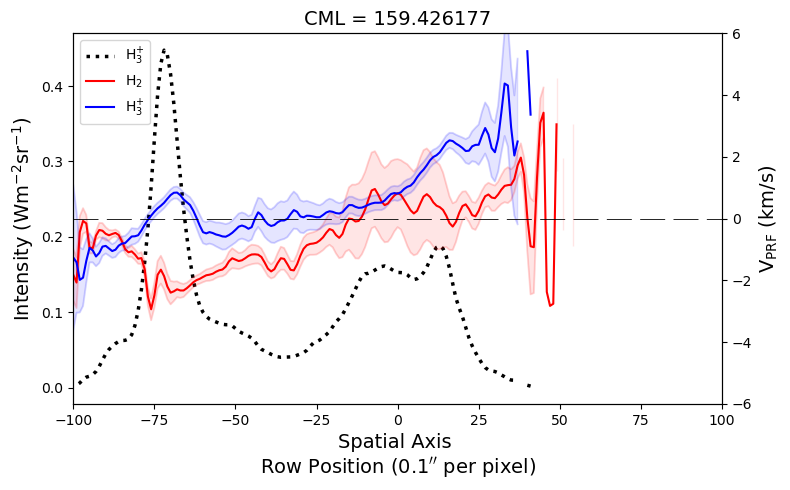

...

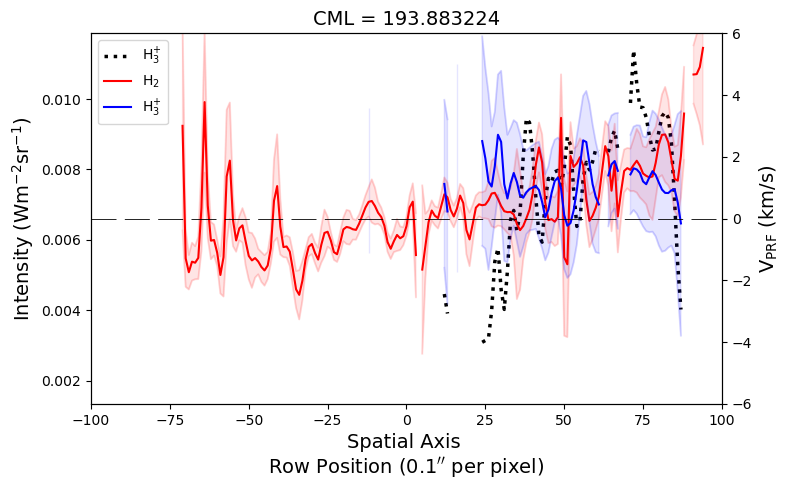

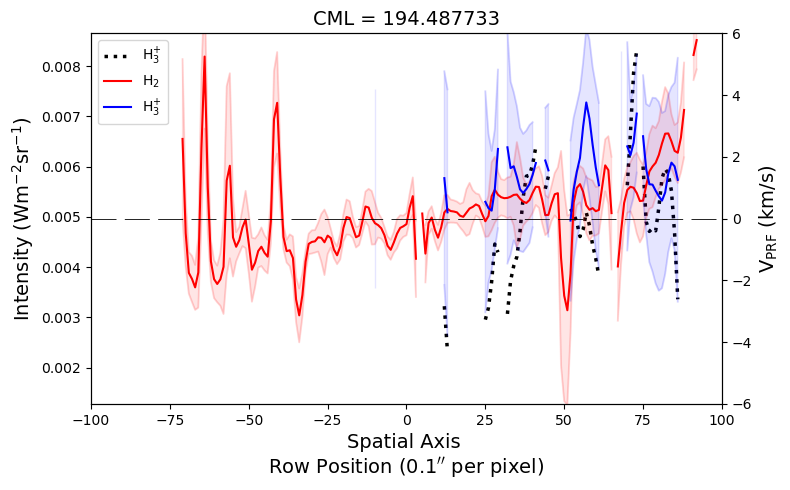

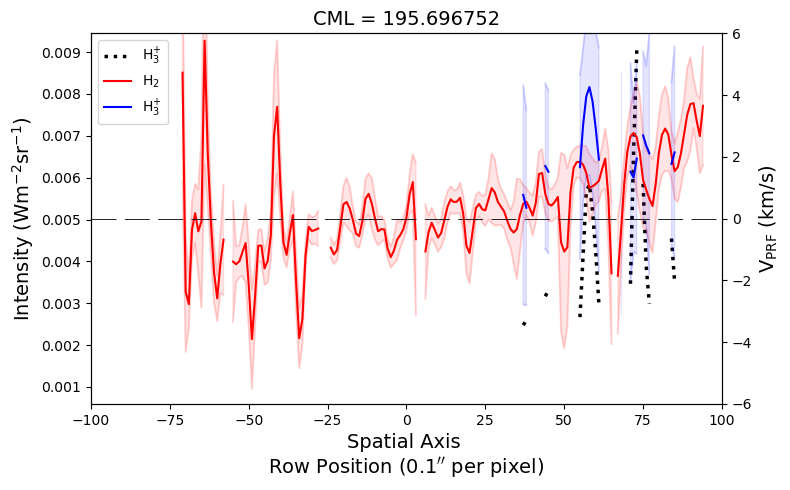

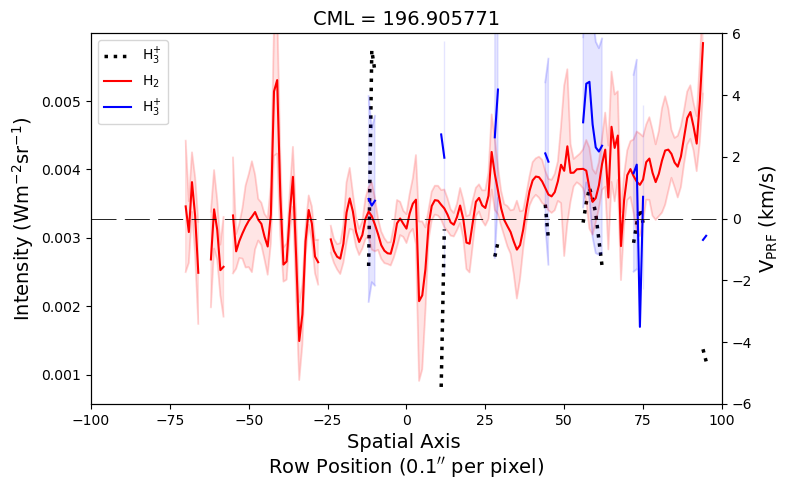

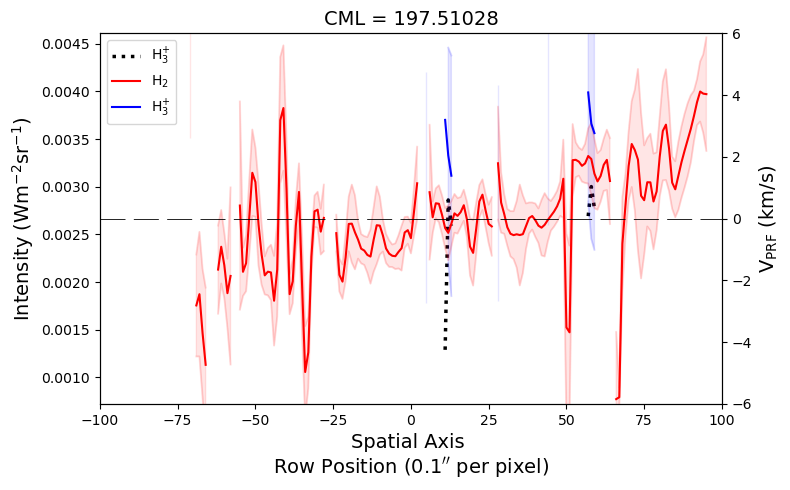

In [7]:
for i in range(len(h3p_vprf)):
# for i in range(18, 19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
#         int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (8, 5))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vh2 = a2[i]
        vh2max = a2[i] + h2_verr[i]
        vh2min = a2[i] - h2_verr[i]
        
        vh3p = b2[i]
        vh3pmax = b2[i] + h3p_verr[i]
        vh3pmin = b2[i] - h3p_verr[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
#         ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vh2, color='red', label='H$_2$')        
        ax2.plot(xnew, vh2max, color='red', alpha=0.1)
        ax2.plot(xnew, vh2min, color='red', alpha=0.1)
        ax2.fill_between(xnew, vh2min, vh2max, color='red', alpha=0.1)
        
        ax2.plot(xnew, vh3p, color='blue', label='H$_3^{+}$')
        ax2.plot(xnew, vh3pmax, color='blue', alpha=0.1)
        ax2.plot(xnew, vh3pmin, color='blue', alpha=0.1)
        ax2.fill_between(xnew, vh3pmin, vh3pmax, color='blue', alpha=0.1)
        
#         ax2.plot(xnew, -rot_rate, color='black', ls='dashed', dashes=(30, 10), lw=1)
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='r', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='b', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c2[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
#         plt.axhline(y=vmp[i], color='black', ls='dashed', dashes=(30, 10), lw=0.6)
#         plt.text(-145,vmp[i]-0.7, 'V$_{\mathrm{mp}}$ = '+str(round(vmp[i], 4)), fontsize=14)
        plt.axhline(y=0, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-100,100)
        plt.ylim(-6,6)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
#         plt.savefig(plots_dir+'h2_h3p_vprf_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

/var/folders/4t/hncrgtmj6ps9tkzxj0c426200000gp/T/ipykernel_598/3086543448.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (8, 5))


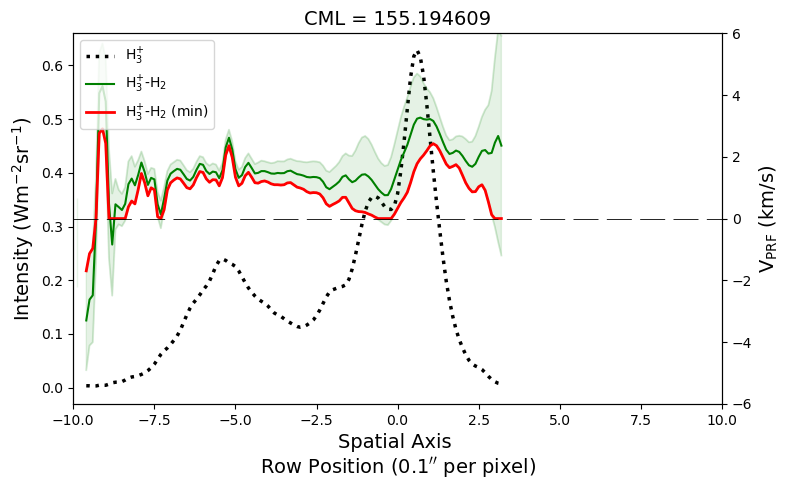

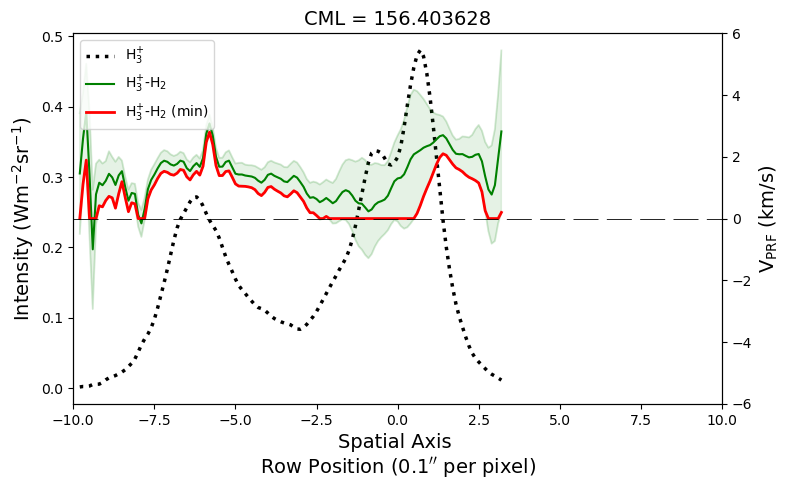

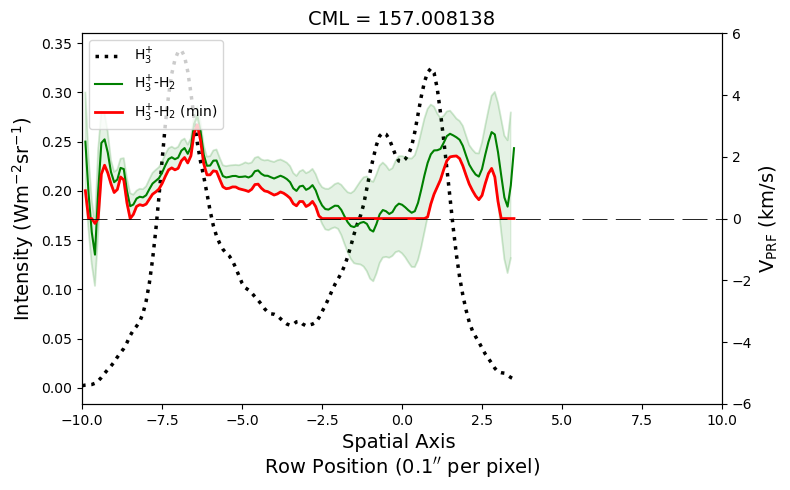

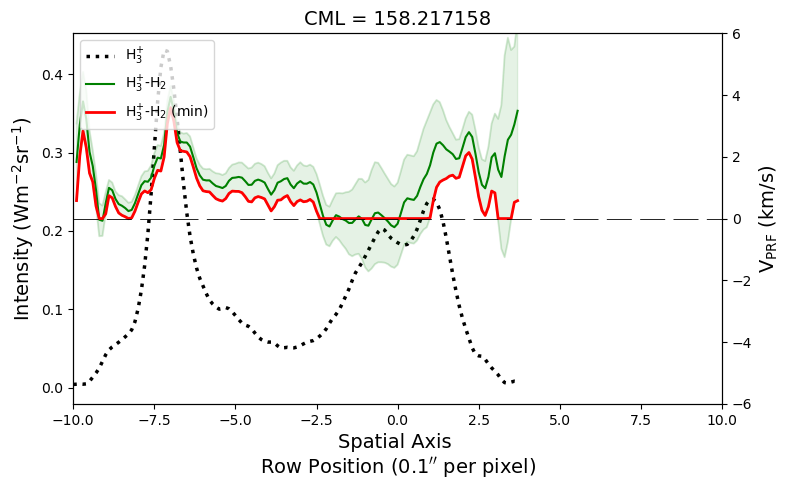

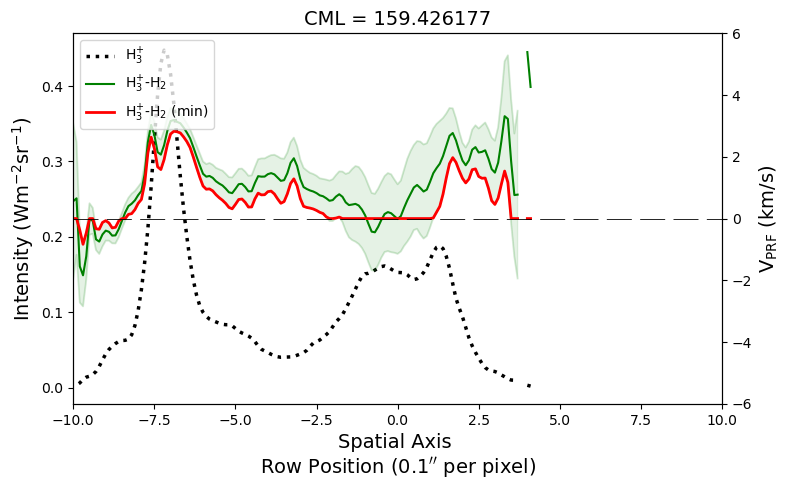

...

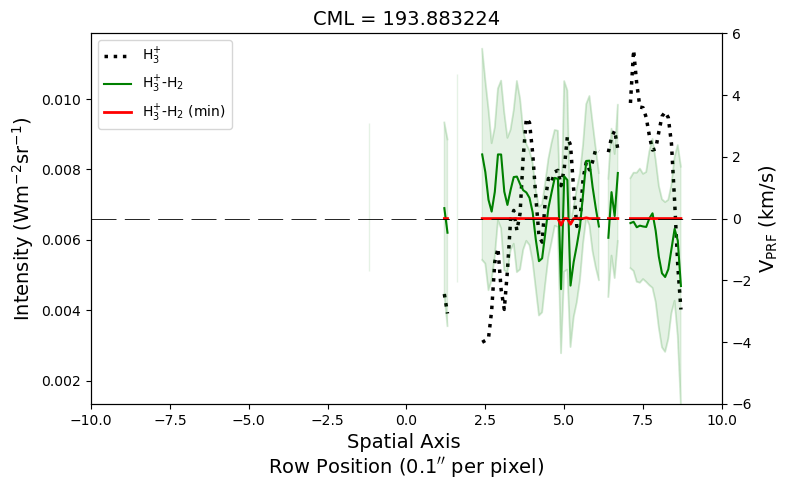

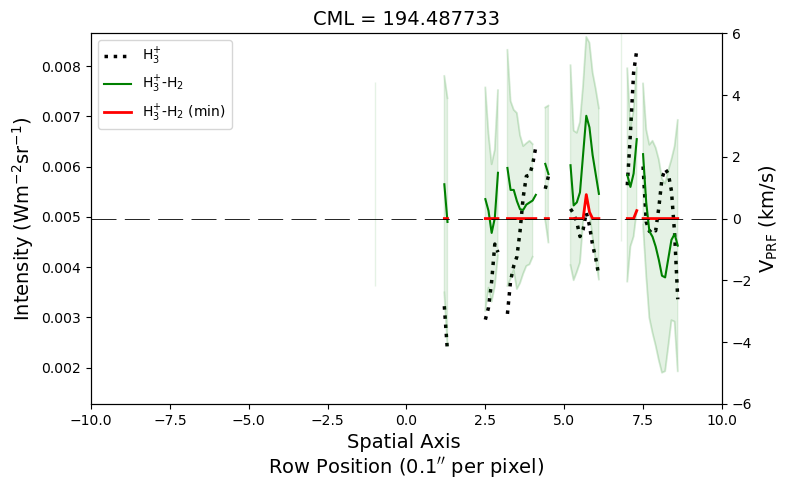

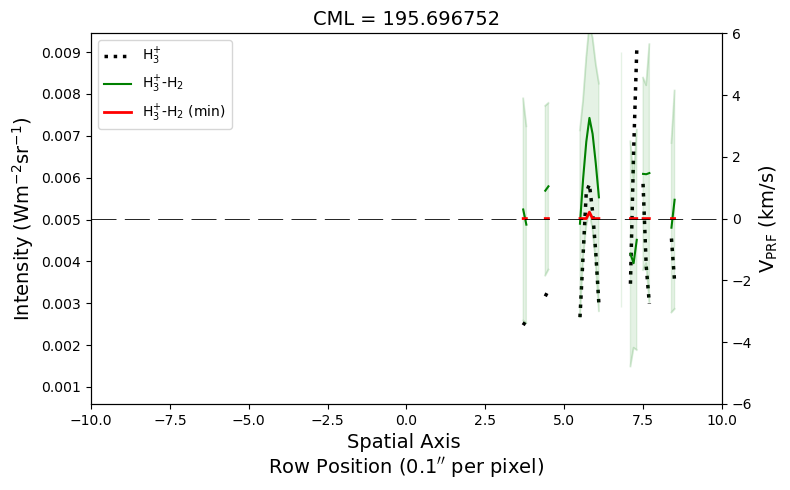

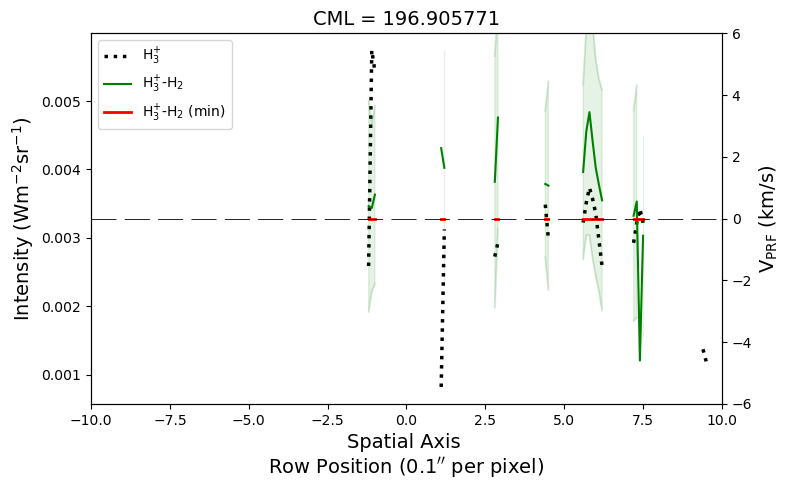

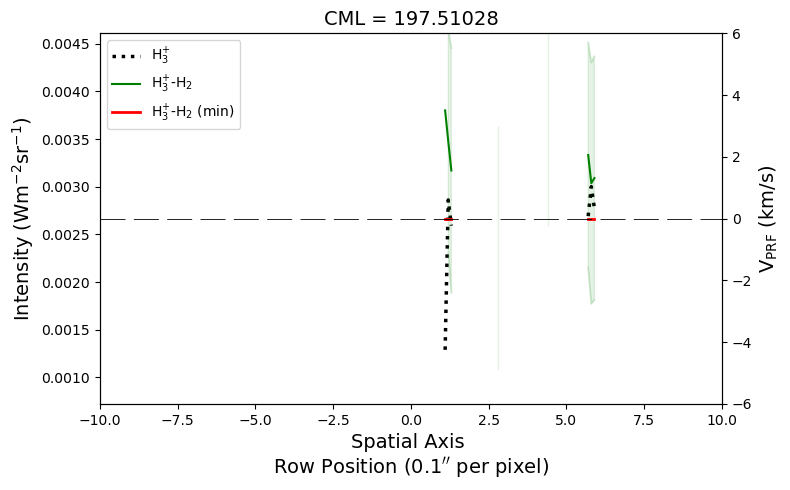

In [3]:
for i in range(len(h3p_vprf)):
# for i in range(18,19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-15,15,301)
#         int2 = (h3p_int/np.nanmax(h3p_int[i])*7.9-3.95)
#         int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
#         fig, ax = plt.subplots(figsize = (12, 4))
        fig, ax = plt.subplots(figsize = (8, 5))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vcur = c2[i]
        vcurmax = vcur + errc2[i]
        vcurmin = vcur - errc2[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
#         ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vcur, color='green', label='H$_3^{+}$-H$_2$')        
        ax2.plot(xnew, vcurmax, color='green', alpha=0.1)
        ax2.plot(xnew, vcurmin, color='green', alpha=0.1)
        ax2.fill_between(xnew, vcurmin, vcurmax, color='green', alpha=0.1)
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='palesalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='paleblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c3[i], yerr=errc2[i], color='green', ecolor='palegreen', label='H$_3^{+}$-H$_2$')
        ax2.plot(xnew, e3[i], color='red', ls='-', label='H$_3^{+}$-H$_2$ (min)', lw=2)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        plt.axhline(y=0, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
#         plt.xlim(-150,150)
#         plt.ylim(-4,4)
        plt.xlim(-10,10)
        plt.ylim(-6,6)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
#         plt.savefig(plots_dir+'exb_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

In [4]:
hdu_h2vp = fits.PrimaryHDU(a2)
hdu_h2vp.writeto('h2_vprf_v2.fits', overwrite=True)

hdu_h3vp = fits.PrimaryHDU(b2)
hdu_h3vp.writeto('h3p_vprf_v2.fits', overwrite=True)

hdu_h2err = fits.PrimaryHDU(h2_verr)
hdu_h2err.writeto('h2_verr_v2.fits', overwrite=True)

hdu_h3err = fits.PrimaryHDU(h3p_verr)
hdu_h3err.writeto('h3p_verr_v2.fits', overwrite=True)

hdu_h2int = fits.PrimaryHDU(h2_int)
hdu_h2int.writeto('h2_int_v2.fits', overwrite=True)

hdu_h3int = fits.PrimaryHDU(h3p_int)
hdu_h3int.writeto('h3p_int_v2.fits', overwrite=True)

hdu_h2int_err = fits.PrimaryHDU(h2_int_err)
hdu_h2int_err.writeto('h2_int_err_v2.fits', overwrite=True)

hdu_h3int_err = fits.PrimaryHDU(h3p_int_err)
hdu_h3int_err.writeto('h3p_int_err_v2.fits', overwrite=True)

[101 117 121 131 136 145 153 187]


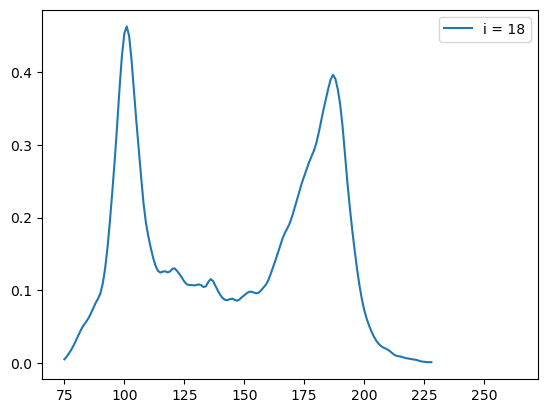

In [3]:
# for i in range(len(h3p_int2)):
for i in range(18,19):
    y = h3p_int[i]
    x = np.linspace(-15,15, len(y))
    
#     if i <= 7:
    # plt.plot(x, h3p_int2[1])
    plt.plot(y, label='i = '+str(i))
#     print(argrelextrema(y[:], np.greater))
    print(argrelextrema(y[70:], np.greater)[0]+70)
    plt.legend()
        
#     if i > 6 and i <=

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


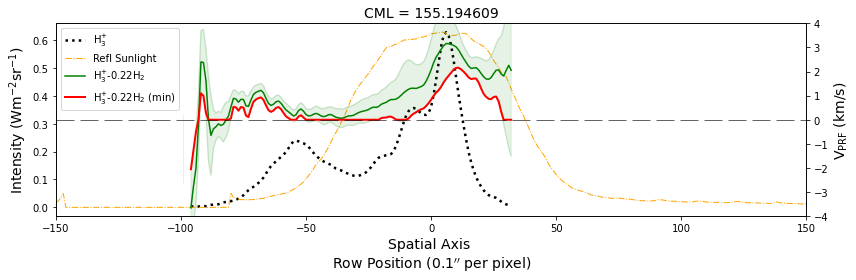

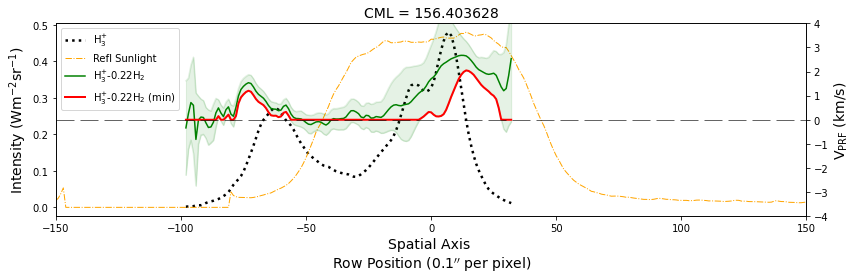

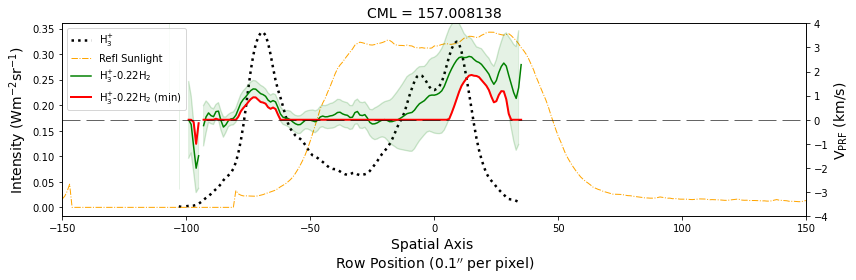

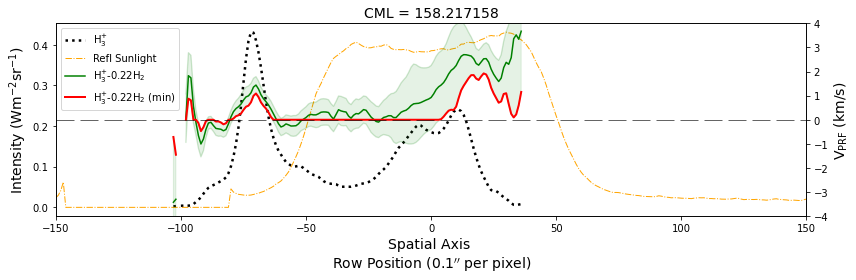

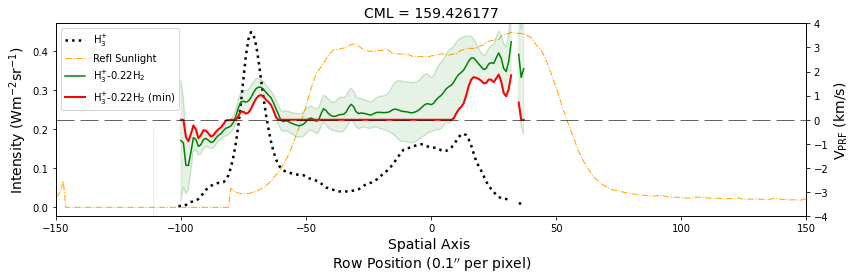

...

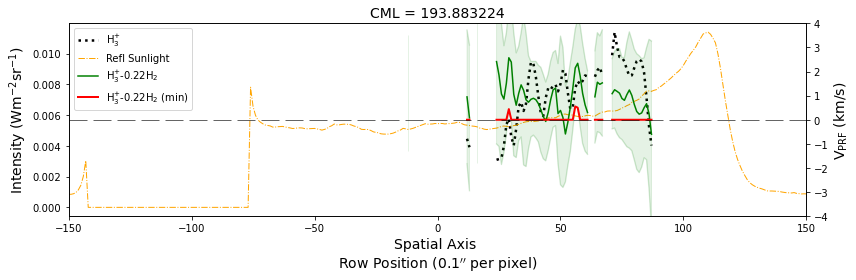

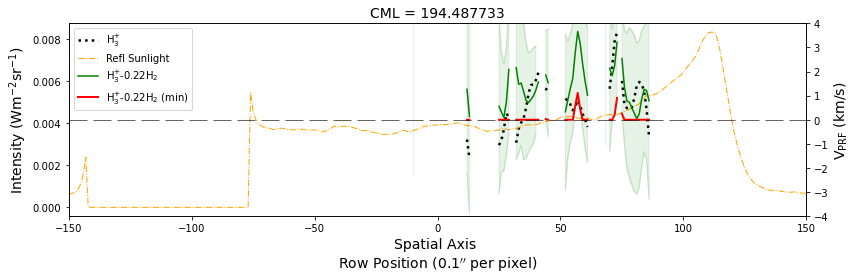

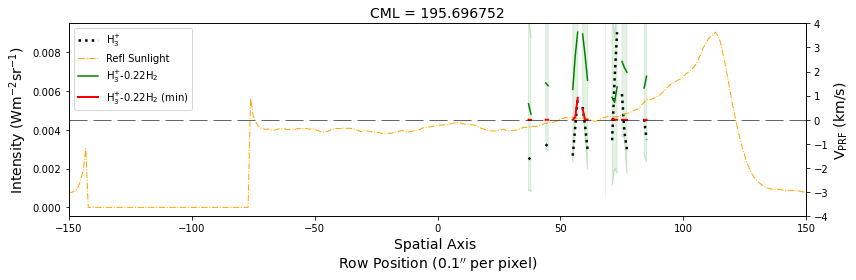

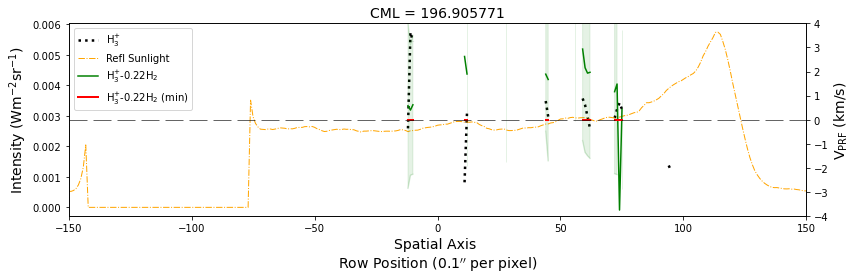

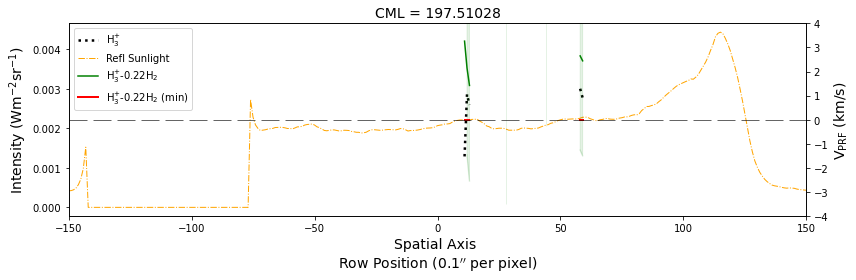

In [10]:
c2 = b2 - a2*0.22
errc2 = np.sqrt((h3p_verr)**2 + (h2_verr)**2)

c3 = c2 + 0
c_min = c2 - errc2
c_max = c2 + errc2
c_max_t = c3/c_max
c_min_t = c3/c_min
c_max_t[c_max_t <0] = 0
c_min_t[c_min_t <0] = 0
m3 = c_max_t * c_min_t

m3[m3 > 0] = 1

d3 = c3 * m3
d3a = c_min * m3
d3b = c_max * m3

e3 = c3 *0
e3[d3 > 0] = c_min[d3 > 0]
e3[d3 < 0] = c_max[d3 < 0]

for i in range(len(h3p_vprf)):
# for i in range(18,19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
#         int2 = (h3p_int/np.nanmax(h3p_int[i])*7.9-3.95)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vcur = c2[i]
        vcurmax = c2[i] + errc2[i]
        vcurmin = c2[i] - errc2[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vcur, color='green', label='H$_3^{+}$-0.22H$_2$')        
        ax2.plot(xnew, vcurmax, color='green', alpha=0.1)
        ax2.plot(xnew, vcurmin, color='green', alpha=0.1)
        ax2.fill_between(xnew, vcurmin, vcurmax, color='green', alpha=0.1)
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='palesalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='paleblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c3[i], yerr=errc2[i], color='green', ecolor='palegreen', label='H$_3^{+}$-H$_2$')
        ax2.plot(xnew, e3[i], color='red', ls='-', label='H$_3^{+}$-0.22H$_2$ (min)', lw=2)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        plt.axhline(y=0, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-4,4)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
#         plt.savefig(plots_dir+'/h2_h3p_curr_fr'+str(i), dpi=400, bbox_inches='tight', facecolor='white')
        plt.savefig(plots_dir+'/curr_0.22h2_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


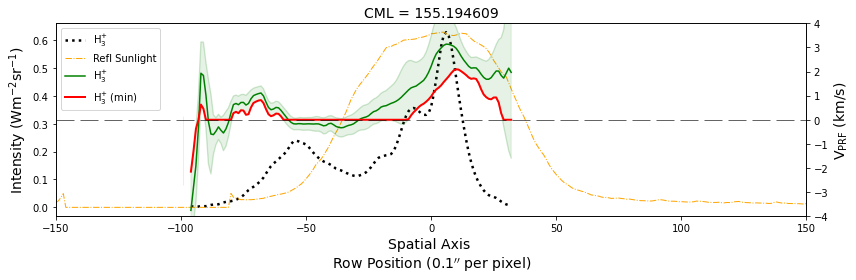

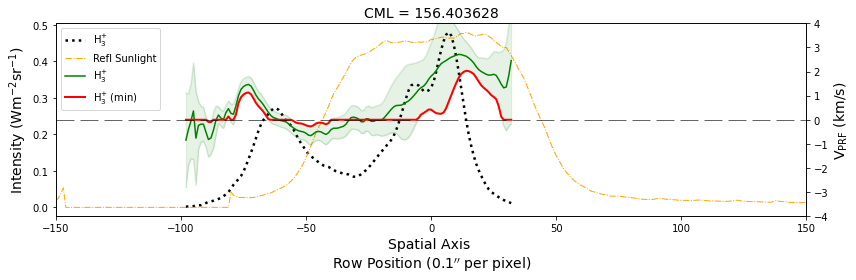

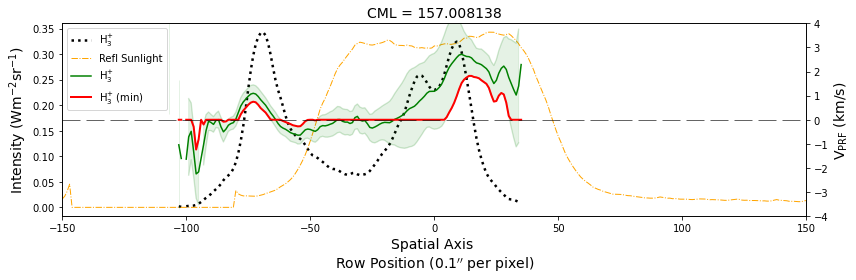

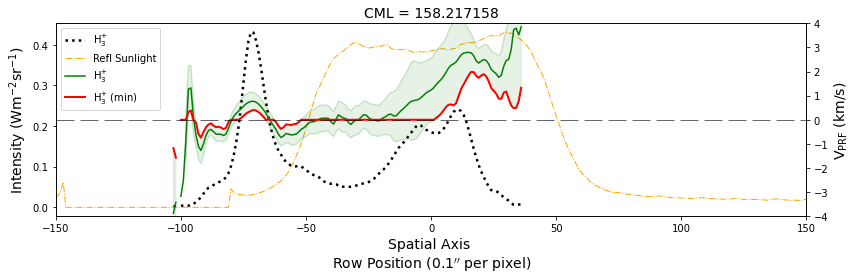

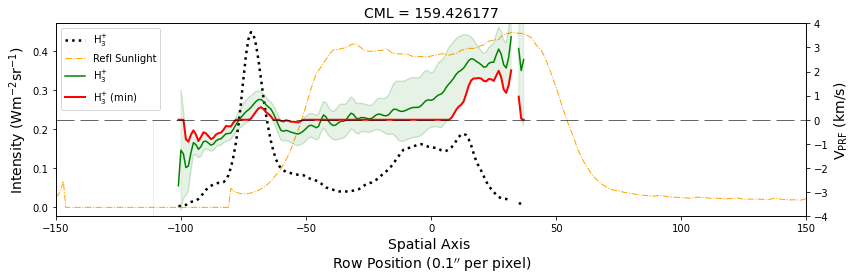

...

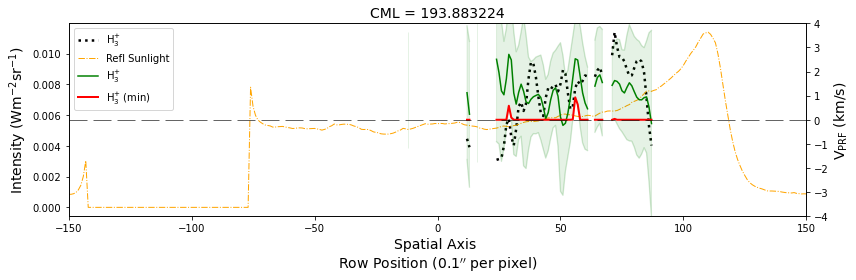

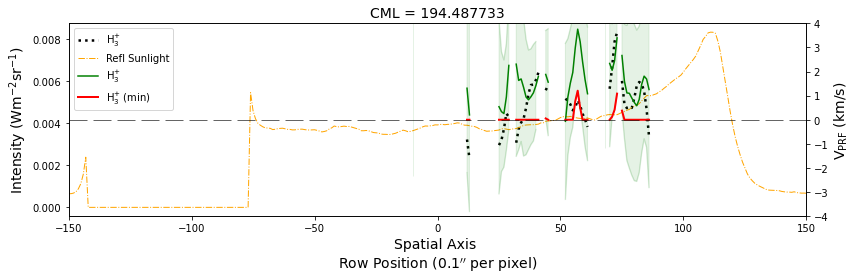

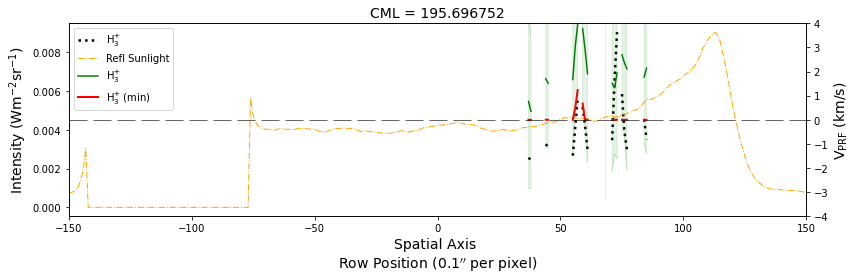

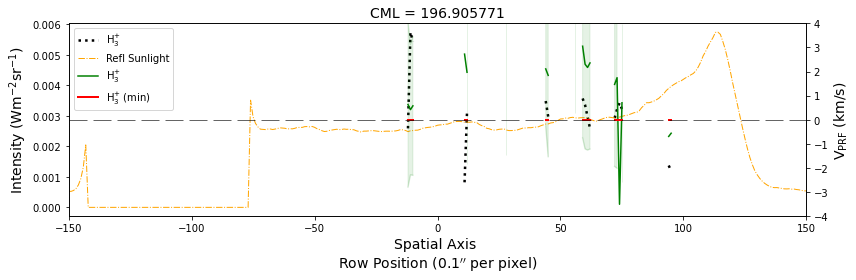

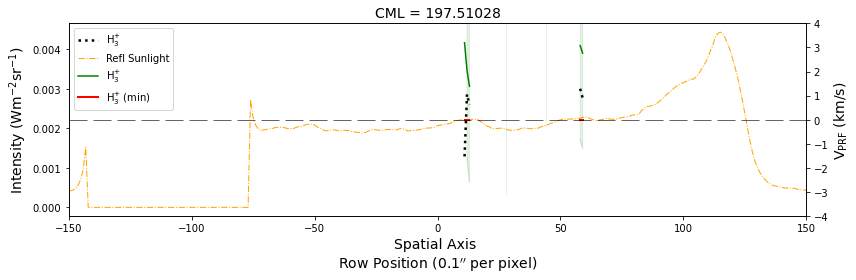

In [11]:
c2 = b2 - a2
errc2 = np.sqrt((h3p_verr)**2 + (h2_verr)**2)

c3 = b2 + 0
c_min = b2 - errc2
c_max = b2 + errc2
c_max_t = c3/c_max
c_min_t = c3/c_min
c_max_t[c_max_t <0] = 0
c_min_t[c_min_t <0] = 0
m3 = c_max_t * c_min_t

m3[m3 > 0] = 1

d3 = c3 * m3
d3a = c_min * m3
d3b = c_max * m3

e3 = c3 *0
e3[d3 > 0] = c_min[d3 > 0]
e3[d3 < 0] = c_max[d3 < 0]

for i in range(len(h3p_vprf)):
# for i in range(18,19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
#         int2 = (h3p_int/np.nanmax(h3p_int[i])*7.9-3.95)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vh2 = a2[i]
        vh2max = a2[i] + h2_verr[i]
        vh2min = a2[i] - h2_verr[i]
        
        vh3p = b2[i]
        vh3pmax = b2[i] + h3p_verr[i]
        vh3pmin = b2[i] - h3p_verr[i]
        
        vcur = c2[i]
        vcurmax = b2[i] + errc2[i]
        vcurmin = b2[i] - errc2[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vh3p, color='green', label='H$_3^{+}$')
#         ax2.plot(xnew, vcur, color='green' )        
        ax2.plot(xnew, vcurmax, color='green', alpha=0.1)
        ax2.plot(xnew, vcurmin, color='green', alpha=0.1)
        ax2.fill_between(xnew, vcurmin, vcurmax, color='green', alpha=0.1)
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='palesalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='paleblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c3[i], yerr=errc2[i], color='green', ecolor='palegreen', label='H$_3^{+}$-H$_2$')
        ax2.plot(xnew, e3[i], color='red', ls='-', label='H$_3^{+}$ (min)', lw=2)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        plt.axhline(y=0, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-4,4)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
        plt.savefig(plots_dir+'/curr_h3p_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')
#         plt.savefig(plots_dir+'/h2_h3p_curr_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')